# Lab 2: Quantization and entropy coding

This lab aims to help understand the quantization of a sound signal using with entropy coding, in particular Huffman coding.

## Relevant concepts:

### Quantization noise
Noise resulting from quantizing a signal. The difference between the original signal and the signal obtained after quantization.

### Signal to Noise Ratio (SNR)
A measure that compares the level of a desired signal to the level of background noise. SNR is defined as the ratio of signal power to noise power, often expressed in decibels. A ratio higher than 1:1 (greater than 0 dB) indicates more signal than noise.

### Entropy
Signal entropy is the minimum number of bits required to describe a encode a signal. It has its maximum value when all probabilities are equal (we assume the number of possible states. is finite), and the resulting value for entropy is the logarithm of the number of states. In audio a high entropy signal could be noise or a complex musical piece with many different levels of loudness and frequency changes.

### Huffman coding
A data compression method, independent of data type, that is commonly used for lossless data compression. It works by assigning shorter codes to more frequent symbols and longer codes to less frequent symbols, thus reducing the overall data size when encoded.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import get_window
from scipy.fft import fft
import IPython.display as ipd
from scipy.io.wavfile import read
import heapq
from collections import Counter

# for printing text in bold
BOLD = "\033[1m"
RESET = "\033[0m"

In [2]:
# functions used in the whole lab
def read_sound(file):
  """ read a mono wav sound file, assuming is mono, and convert it to a floating point array
    Args:
      file (str): File name
    Returns:
      sound_array (numpy.array): Array of samples as floating point values between -1 and 1
      sampling_rate (int): Sampling rate
  """
  sampling_rate, x = read(file)
  # convert to floating point values between -1 and 1, assuming x are 16 bit integers
  sound_array = np.float32(x) / 2**15
  return sound_array, sampling_rate

def display_sound(sound_array, sampling_rate=44100):
  """ Display signal sound_array
    Args:
      sound_array (numpy.array): Array of samples
      sampling_rate (int): Sampling rate
  """
  plt.figure(0, figsize=(10, 4))
  time_indexes = np.arange(0, sound_array.size/sampling_rate, 1.0/sampling_rate)
  plt.plot(time_indexes, sound_array)
  plt.xlabel('time (seconds)')
  plt.ylabel('amplitude')
  ipd.display(ipd.Audio(data=sound_array, rate=sampling_rate))
  plt.xlim(0, 0.1)
  plt.show()

def display_spectrum(sound_array, sampling_rate=44100):
  """ Display magnitude spectrum of signal sound_array
    Args:
      sound_array (numpy.array): Array of samples
      sampling_rate (int): Sampling rate
  """
  window = get_window('hann', sound_array.size)
  spectrum = fft(window*sound_array)
  magnitude_spectrum= 20*np.log10(abs(spectrum[:spectrum.size//2]))

  plt.figure(0, figsize=(10, 5))
  frequency_indexes = np.arange(0, sampling_rate/2, sampling_rate/spectrum.size)
  plt.plot(frequency_indexes, magnitude_spectrum)
  plt.xlabel('frequency (Hz)')
  plt.ylabel('amplitude (dB)')
  plt.show()

def display_spectrogram(sound_array, hop_size=256, fft_size=512, sampling_rate=44100):
  """ Display magnitude spectrogram of signal sound_array
    Args:
      sound_array (numpy.array): Array of samples
      hop_size (int): window hop size
      fft_size (int): Spectrogram fft size
      sampling_rate (int): Sampling rate of sound
  """
  sample_index = 0
  window = get_window('hann', fft_size)
  magnitude_spectrogram = []
  while sample_index < sound_array.size-fft_size:
    spectrum = fft(window*sound_array[sample_index:sample_index+fft_size])
    magnitude_spectrum= 20*np.log10(abs(spectrum[:spectrum.size//2]))
    magnitude_spectrogram.append(magnitude_spectrum)
    sample_index += hop_size

  plt.figure(figsize=(10, 5))
  time_indexes = np.arange(0, sample_index/sampling_rate, hop_size/sampling_rate)
  frequency_indexes = np.arange(0, sampling_rate/2, sampling_rate/fft_size)
  plt.pcolormesh(time_indexes, frequency_indexes, np.transpose(magnitude_spectrogram), shading='nearest', cmap='inferno')
  plt.colorbar(format='%+2.0f dB')
  plt.xlabel('time (seconds)')
  plt.ylabel('frequency (Hz)')
  #plt.ylim(0, 1000)
  plt.show()

# Part 1 Scalar quantization
Explore the impact of quantization in a sound file by measuring its SNR. Modify the code given as needed and answer the questions given.

In [3]:
def quantize_signal(x, original_bits, target_bits):
  """Quantizes a signal x, assuming it originally had original_bits bits per sample, to target_bits per sample.
  Args:
    x (numpy.array): Array of samples as floating point values between -1 and 1
    original_bits (int): Number of bits of the signal that x represents
    target_bits (int): Number of bits per sample of the output signal
  """
  # Scaling the signal to the range of [0, 2^target_bits - 1]
  x_scaled = (x - np.min(x)) / (np.max(x) - np.min(x)) * (2**target_bits - 1)
  # Quantize by rounding
  x_quantized = np.round(x_scaled)
  # Re-scaling back to the original amplitude range
  x_output = (x_quantized / (2**target_bits - 1)) * (np.max(x) - np.min(x)) + np.min(x)
  return x_output

def calculate_snr(x, y):
    """Calculate the Signal-to-Noise Ratio (SNR) of a quantized signal.
    Args:
    x (numpy.array): The original signal
    y (numpy.array): The quantized signal
    Returns:
    snr_db (float): The SNR in decibels (dB)
    """
    # Ensure that x and y are numpy arrays
    x = np.asarray(x)
    y = np.asarray(y)
    # Calculate the signal power (mean squared value of the original signal)
    signal_power = np.mean(x ** 2)
    # Calculate the noise power (mean squared difference between original and quantized signal)
    noise_power = np.mean((x - y) ** 2)
    # Compute the SNR
    snr = signal_power / noise_power
    # Convert SNR to decibels (dB)
    snr_db = 10 * np.log10(snr)
    return snr_db

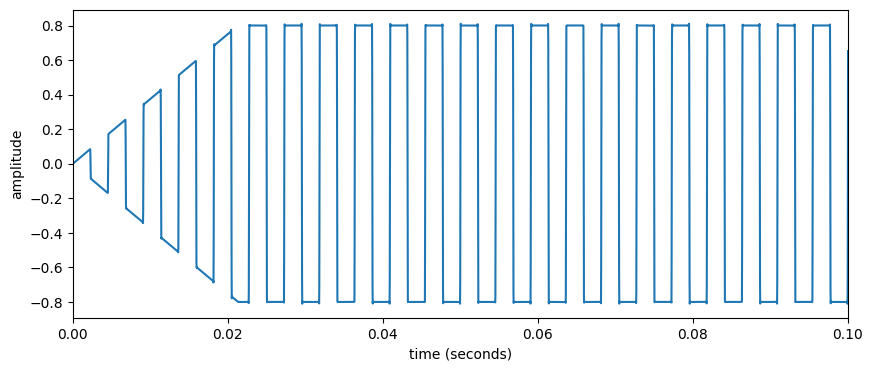

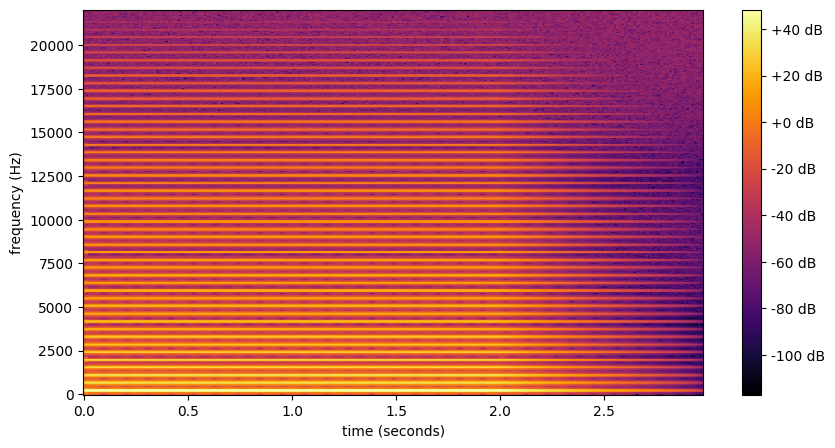

In [4]:
# read and display a sound
#sound_array, sampling_rate = read_sound('../sounds/721313-hangpan.wav')
sound_array, sampling_rate = read_sound('../sounds/synthetic.wav')
#sound_array, sampling_rate = read_sound('../sounds/sinewave.wav')
display_sound(sound_array,sampling_rate)
display_spectrogram(sound_array, 512, 1024, sampling_rate)

SNR: 46.47502422332764 dB


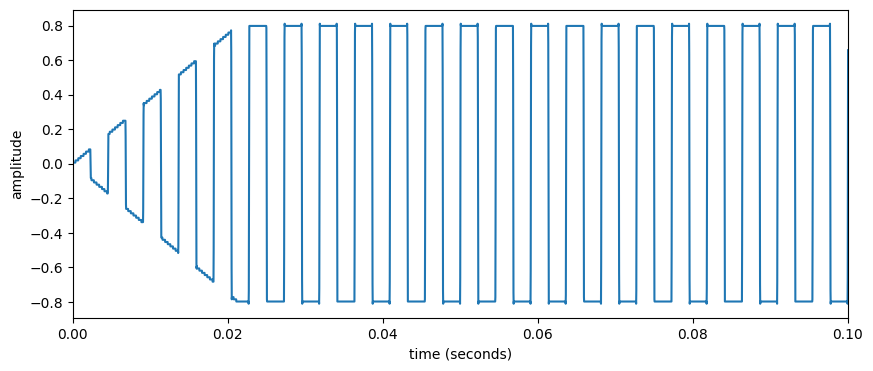

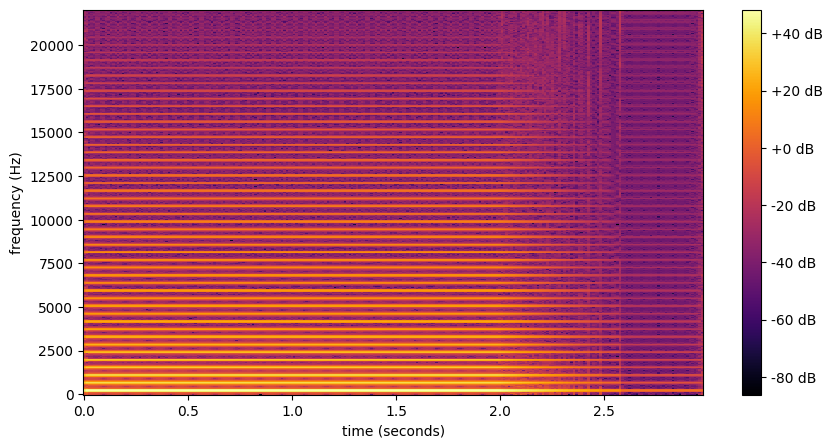

In [5]:
# quantize the sound (originally at 16 bits) to progressively fewer number of bits
# until you star hearing the quantization noise and compute its SNR
number_of_bits = 7
quantized_sound_array = quantize_signal(sound_array, 16, number_of_bits)

# compute SNR
snr = calculate_snr(sound_array, quantized_sound_array)
print("SNR: %r dB" %snr)

# display quantized sound
display_sound(quantized_sound_array,sampling_rate)
display_spectrogram(quantized_sound_array, 512, 1024, sampling_rate)

**Questions: (answer in this text cell)**

**1. Choose a sound, not `synthetic.wav`, from the sound directory and change the original bit rate (they all have a bit rate of 16bits). What is the lowest bit rate at which you start hearing the quantization noise? Explain the result using the SNR value and the spectrogram.**

After testing, the lowest bit rate where I don't perceive any noise is 7 bits. Below this, distortion becomes noticeable, and the sound starts to lose its clarity, becoming more metallic and less "pure."

The Signal-to-Noise Ratio (SNR) measures the difference between the signal and the noise introduced during quantization. A higher SNR means the signal is much stronger than the noise. With 7 bits, the SNR is 40.9 dB, meaning the distortion is low and the sound quality is good. As the bit rate decreases further, the SNR decreases, indicating that the noise becomes more prominent compared to the original signal, leading to a less clear and more distorted sound.

In the spectrogram of the sinewave.wav sound, we can see a clear frequency band around 450 Hz (after zooming in). When quantized with fewer than 7 bits, additional frequency bands start to appear. These are artifacts introduced by the quantization process and are responsible for the distortion in the sound.

**2. Now compare the results with doing the same in `synthetic.wav`. Try the same bit rate change for `synthetic.wav`? Does it result into the same SNR? Do you hear the quantization noise equally? If not, explain why not?**

When applying the same bit rate reduction to synthetic.wav, I noticed that the bit rate can be lowered more significantly without a noticeable reduction in sound quality. With 4 bits, only the last seconds of the audio file show a slight degradation in quality, while the rest of the sound remains almost indistinguishable from the original. This is because synthetic.wav consists of a simple, rectangular sinewave, which is less complex and thus less susceptible to audible changes during quantization.

Even though the SNR is lower in this case (indicating theoretically higher quantization noise), the noise is less perceptible. This happens because the synthetic waveform is more uniform and periodic, making it less sensitive to the distortions introduced by quantization. The simpler structure of the synthetic waveform produces fewer noticeable artifacts. Essentially, more values may be altered due to the higher quantization factor, but these variations are smaller and less perceptible because of the sound's simplicity.

---

# Part 2 - Entropy calculation

Compute the probability distributions and the entropy of different signals. Correlate these measurements with the characteristics of the sounds. Answer the questions given and modify the code to support your answers.

In [6]:
def calculate_entropy(probs):
    """
    Args:
        probs (np.array): Array of probs. for each symbol in the source
    Returns:
        H (float): entropy value
    """
    H = 0
    for p in probs:
      if(p > 0):
        H -= p * np.log2(p)
      elif(p < 0):
        return np.nan
    return H

def get_prob_per_symbol(y):
    """ Get symbol occurrence probability
    Args:
        x (np.array): Input signal
    Returns:
        (np.array, np.array): (sorted symbols, corresponding probabilities)
    """
    symbols, count = np.unique(y, return_counts=True)
    probs = count / sum(count)
    return symbols, probs

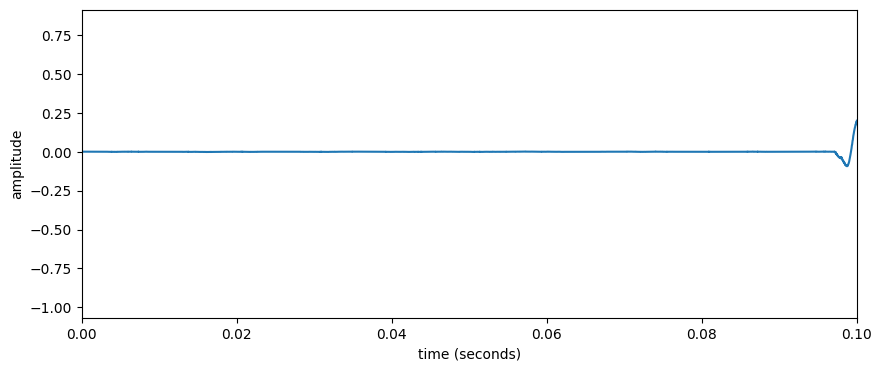

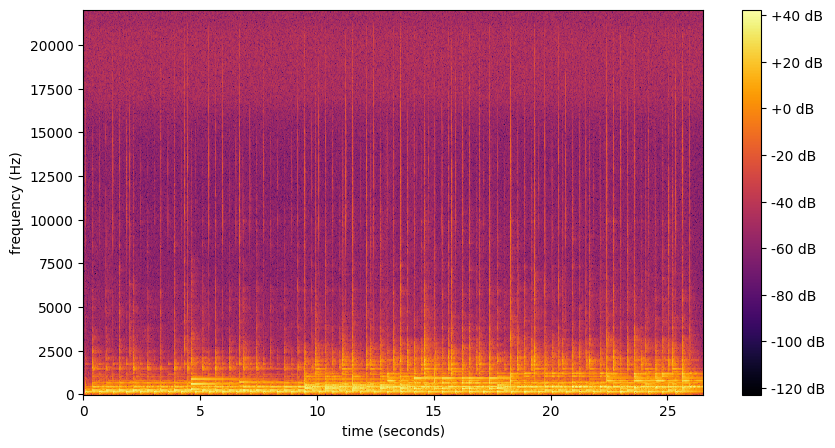

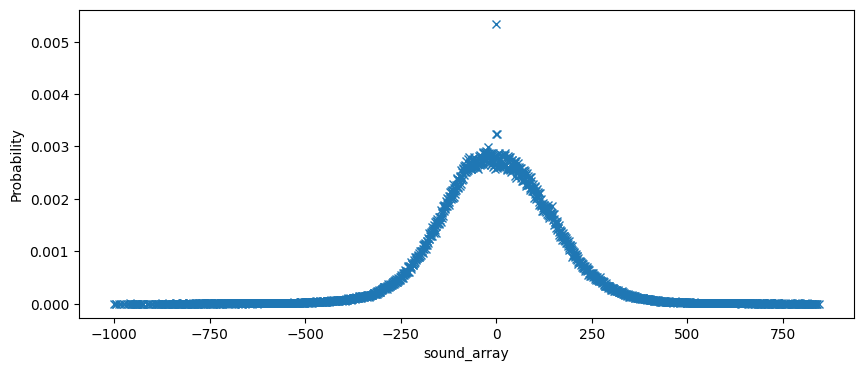

Entropy: 9.23076518580075


In [7]:
# read a sound
sound_array, sampling_rate = read_sound('../sounds/721313-hangpan.wav')
# sound_array, sampling_rate = read_sound('../sounds/synthetic.wav')
# sound_array, sampling_rate = read_sound('../sounds/406609-tuba.wav')
#sound_array, sampling_rate = read_sound('../sounds/750340-background-music.wav')

display_sound(sound_array, sampling_rate)
display_spectrogram(sound_array, 512, 1024, sampling_rate)

# Quantize the sound_array by giving the number of bits to use
nbits = 10
x_scaled = sound_array * 2**nbits
x_quantized = np.int16(np.round(x_scaled))

# compute the probabilities of all the signal values
symbols, probs = get_prob_per_symbol(x_quantized)

plt.figure(0, figsize=(10, 4))
plt.plot(symbols, probs, 'x')
plt.xlabel("sound_array"), plt.ylabel("Probability")
plt.show()

# compute the entropy value
h = calculate_entropy(probs)
print("Entropy:", h)

**Questions:**

**1. Compare the probability distributions of different sounds. Choose 3 sounds from the sound directory that would result in distinct probabilty distributions. Compute their probability distributions and describe them, their similarities and differences. Show the plots in the cell above of all the results and explain them here.**

**Hangpan**: The probability distribution resembles a normal distribution with a single peak at 0. This indicates that the majority of the amplitude values are concentrated around the center, with lower probabilities as you move away from 0. The high point at 0 suggests that the sound has a stable and consistent amplitude.

**Synthetic**: This distribution is relatively flat, with a very small bell shape centered around 0, indicating that the sound has a wide range of amplitude values that occur with similar frequency. It also shows 2 notable peaks at amplitude values of +200 and -200, indicating that the sound wave consistently reaches these specific amplitude levels. 

**Tuba**: The probability distribution of the tuba has a complex shape that resembles an "M." This indicates the presence of multiple peaks, which correspond to the fundamental frequency and harmonics. The multiple peaks suggest variability in amplitude, characteristic of a more complex, resonant sound.

**2. For one of the sounds, change the number of "symbols" used by changing the quantization value. Give the resulting number of symbols. Compare the resulting probability distributions for the different quantizations. Explain the result.**
After selecting the hangpan sound, I compared the probability distributions for three different quantization values: 8, 4, and 10 bits.

For **8 bits**, the original quantization, the distribution is clearly defined (normal distribution), with distinct peaks at certain values. The symbols are spread out, and the probability distribution reflects a detailed range of sound amplitudes.

With **4 bits**, there are far fewer quantization levels, meaning the sound samples are grouped into fewer distinct values. This results in a more spaced-out distribution, creating larger gaps between symbols. Hence, the probability value for each sample is higher. 

At **10 bits**, the quantization is finer, with more levels available to represent the sound. As a result, the values become more tightly packed, with many samples filling the space between previously more distant values. The probability distribution becomes denser, and individual symbol probabilities decrease because there are more distinct values represented.

This difference in visualizations reflects how lower quantization (4 bits) compresses the sound at the cost of detail, while higher quantization (10 bits) captures more detail but reduces the probability for each specific amplitude value due to the increased number of symbols.


**3. Compute the entropy values of the distributions obtained in question 1 and explain the relation between the entropy values obtained and the shape of the probability distributions.**
Entropy reflects the unpredictability or complexity of the sound's probability distribution. A higher entropy value indicates a more complex or varied signal with many different possible amplitude values occurring with similar probabilities.

**hangpan (7.23):** The hangpan sound shows a moderate level of entropy. Its probability distribution, as described before, includes a central peak and some surrounding variability, indicating a balance between predictability and variety in the sound.

**synthetic (4.14):** This has the lowest entropy. The synthetic sound is very predictable, with distinct, repeated amplitude values, which result in less uncertainty and lower entropy. The sound is simple, with fewer distinct amplitude values dominating the distribution.

**tuba (8.65):** The tuba sound has the highest entropy, reflecting its more complex and varied probability distribution. There is a wide range of sound amplitudes, spread across the distribution, making it more unpredictable compared to the synthetic sound. This variety and complexity in the distribution result in a higher entropy value.

In summary, sounds with more distinct or concentrated values, like the synthetic one, have lower entropy, while more complex sounds with varied amplitudes, like the tuba, have higher entropy, as the entropy values correspond to the spread and complexity of the probability distributions. 

---

# Part 3 Huffman encoding
Encode and decode a signal using Huffman coding and understand its effectiveness in different types of sounds. Answer the questions given and modify the code to support your answers.

In [8]:
from dataclasses import dataclass, field
from typing import Optional

# functions used to implement huffman coding with the heap queue algorithm
# (priority queue algorithm)

# Define a tree node
@dataclass(order=True)
class Node:
    freq: int
    char: str = field(compare=False)
    left: Optional["Node"] = field(compare=False)
    right: Optional["Node"] = field(compare=False)

    def __init__(self, char=None, freq=0, left=None, right=None):
        self.char = char
        self.freq = freq
        self.left = left  # left child
        self.right = right  # right child

def build_huffman_tree(frequencies):
    heap = [Node(char, freq) for char, freq in frequencies.items()]
    heapq.heapify(heap)

    while len(heap) > 1:
        left = heapq.heappop(heap)
        right = heapq.heappop(heap)
        merged = Node(None, left.freq + right.freq, left, right)
        heapq.heappush(heap, merged)

    return heap[0]

def generate_huffman_codes(node, prefix="", code_map={}):
    if node is None:
        return

    if node.char is not None:
        code_map[node.char] = prefix
    else:
        generate_huffman_codes(node.left, prefix + "0", code_map)
        generate_huffman_codes(node.right, prefix + "1", code_map)

    return code_map

def encode(array, code_map):
    return ''.join(code_map[char] for char in array)

def decode(encoded_string, root):
    decoded_array = []
    node = root
    for bit in encoded_string:
        if bit == '0':
            node = node.left
        else:
            node = node.right

        if node.char is not None:
            decoded_array.append(node.char)
            node = root

    return decoded_array

In [9]:
def apply_huffman_to_sound(file_path, sampling_rate_modifier=1, quantization_bits=16):
    # Step 1: Read the original sound
    sound_array, sampling_rate = read_sound(file_path)

    # Apply the sampling rate modification (if any)
    new_sampling_rate = sampling_rate // sampling_rate_modifier
    modified_sound_array = sound_array[::sampling_rate_modifier]

    # Quantize to specified number of bits (if any)
    max_amplitude = np.max(np.abs(modified_sound_array))  # normalize by the max amplitude
    x_scaled = modified_sound_array / max_amplitude  # normalize between -1 and 1
    x_scaled = x_scaled * (2 ** (quantization_bits - 1) - 1)  # scale to the new bit depth
    x_quantized = np.int16(np.round(x_scaled))

    # Step 2: Calculate frequencies of each signal value (modified sound)
    frequencies = Counter(x_quantized)
    total_samples = len(x_quantized)
    probabilities = {key: freq / total_samples for key, freq in frequencies.items()}

    # Step 3: Plot the probability distribution
    plt.figure(figsize=(10, 6))
    plt.plot(probabilities.keys(), probabilities.values(), 'x')
    plt.title(f"Probability Distribution of Modified Signal ({file_path})")
    plt.xlabel("Value")
    plt.ylabel("Probability")
    plt.grid(True)
    plt.show()

    # Step 4: Build the Huffman tree for the modified sound
    root = build_huffman_tree(frequencies)

    # Step 5: Generate Huffman codes
    huffman_codes = generate_huffman_codes(root)

    # Step 6: Encode the modified sound array
    encoded_x = encode(x_quantized, huffman_codes)

    # Step 7: Decode the encoded sound
    decoded_x = np.array(decode(encoded_x, root))

    # Calculate the size of the original and modified signals
    original_size_bits = len(sound_array) * 16  # assuming the original was 16 bits per sample
    modified_size_bits = len(x_quantized) * quantization_bits  # quantized size in bits
    encoded_size_bits = len(encoded_x)  # encoded size in bits

    # Calculate the compression ratio and percentage
    compression_ratio = original_size_bits / encoded_size_bits
    compression_percentage = (1 - (encoded_size_bits / original_size_bits)) * 100
    
    # Output the results
    print(f"  Original Size (bits): {original_size_bits}")
    if sampling_rate_modifier != 1 or quantization_bits != 16: # Only display modified sound if it's different from the original
        print(f"  Modified Size (bits): {modified_size_bits}")
    print(f"  Encoded Size (bits): {encoded_size_bits}")
    print(f"  Compression Ratio: {compression_ratio:.2f}")
    print(f"  Compression Percentage: {compression_percentage:.2f}%")    
    print(f"  Number of Huffman Codes: {len(huffman_codes)}")

    # Display original sound
    print(f"Playing original sound: {file_path}")
    ipd.display(ipd.Audio(data=sound_array, rate=sampling_rate))

    # Display decoded sound
    print(f"Playing decoded sound after Huffman compression: {file_path}")
    ipd.display(ipd.Audio(data=decoded_x, rate=new_sampling_rate))

    # Only display modified sound if it's different from the original
    if sampling_rate_modifier != 1 or quantization_bits != 16:
        print(f"Playing modified (quantized + downsampled) sound: {file_path}")
        ipd.display(ipd.Audio(data=x_quantized, rate=new_sampling_rate))


Sound: Hangpan


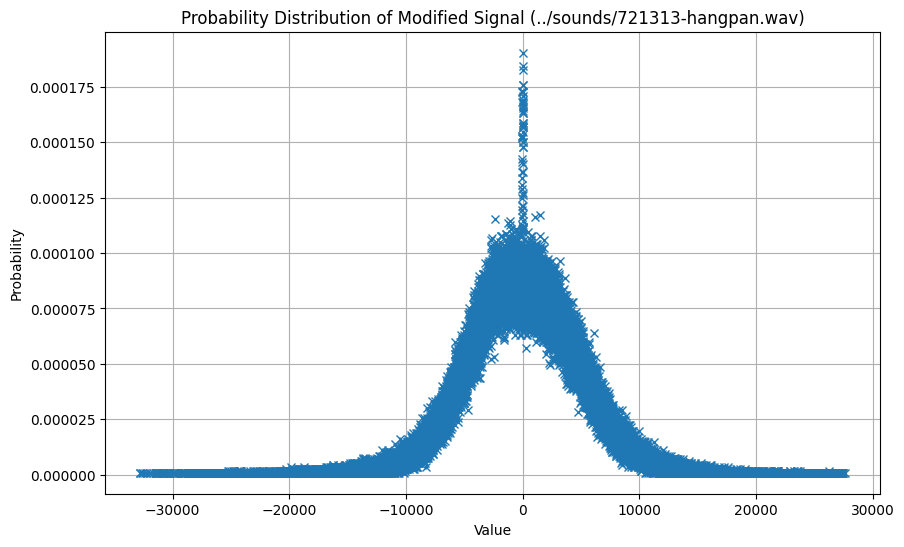

  Original Size (bits): 18740864
  Encoded Size (bits): 16679286
  Compression Ratio: 1.12
  Compression Percentage: 11.00%
  Number of Huffman Codes: 34243
Playing original sound: ../sounds/721313-hangpan.wav


Playing decoded sound after Huffman compression: ../sounds/721313-hangpan.wav




Sound: Synthetic


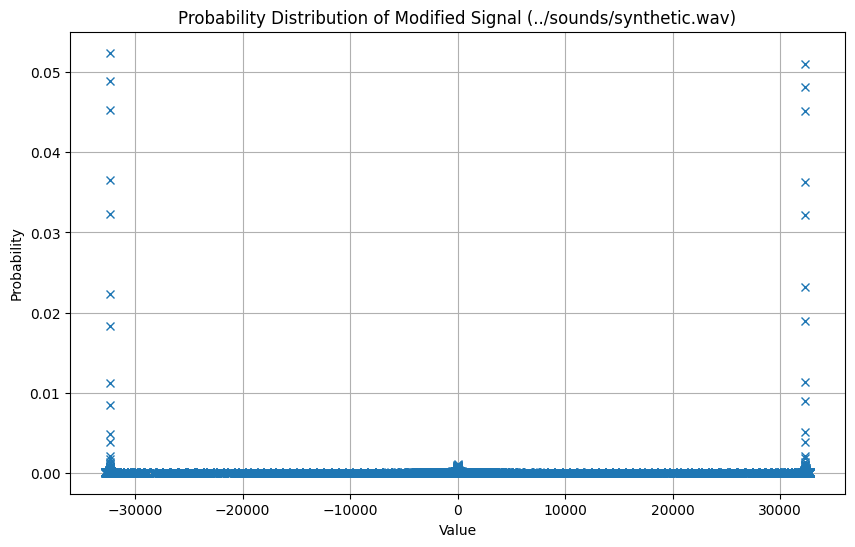

  Original Size (bits): 2116800
  Encoded Size (bits): 1162070
  Compression Ratio: 1.82
  Compression Percentage: 45.10%
  Number of Huffman Codes: 39334
Playing original sound: ../sounds/synthetic.wav


Playing decoded sound after Huffman compression: ../sounds/synthetic.wav




Sound: Tuba


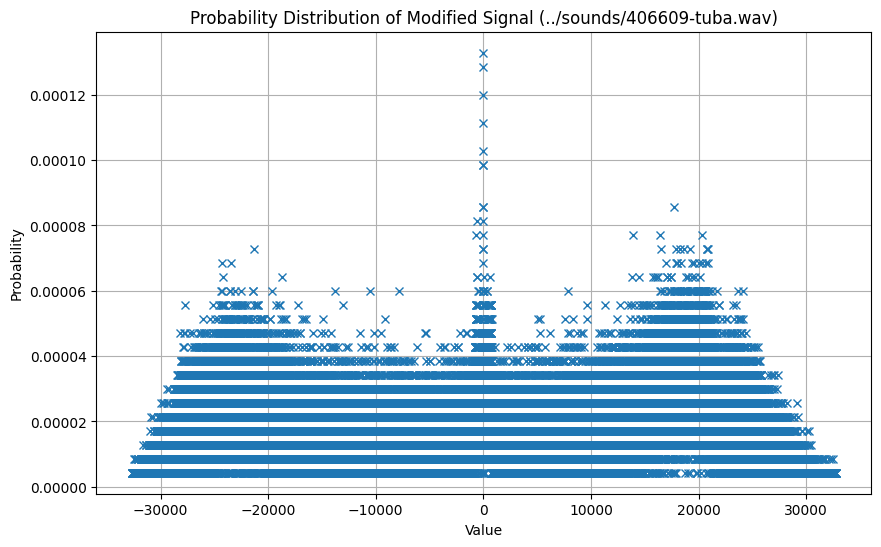

  Original Size (bits): 3731968
  Encoded Size (bits): 3613650
  Compression Ratio: 1.03
  Compression Percentage: 3.17%
  Number of Huffman Codes: 58850
Playing original sound: ../sounds/406609-tuba.wav


Playing decoded sound after Huffman compression: ../sounds/406609-tuba.wav


In [10]:
# Apply Huffman coding to the three sound files
sounds = {
    'Hangpan': '../sounds/721313-hangpan.wav',
    'Synthetic': '../sounds/synthetic.wav',
    'Tuba': '../sounds/406609-tuba.wav'
}

# Loop through each sound and apply Huffman coding, printing results directly
for name, path in sounds.items():
    print(f"Sound: {BOLD}{name}{RESET}")
    apply_huffman_to_sound(path)
    print('\n')

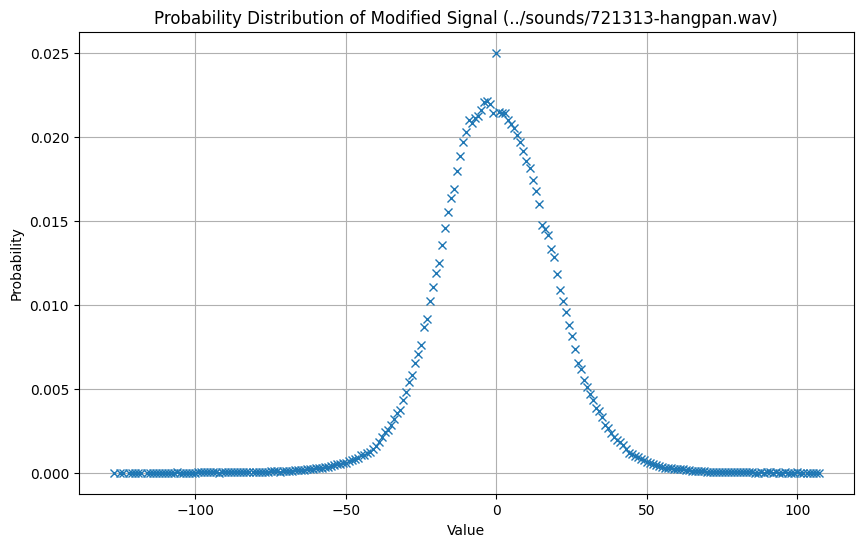

  Original Size (bits): 18740864
  Modified Size (bits): 4685216
  Encoded Size (bits): 3689307
  Compression Ratio: 5.08
  Compression Percentage: 80.31%
  Number of Huffman Codes: 58850
Playing original sound: ../sounds/721313-hangpan.wav


Playing decoded sound after Huffman compression: ../sounds/721313-hangpan.wav


Playing modified (quantized + downsampled) sound: ../sounds/721313-hangpan.wav


In [11]:
# Apply Huffman coding to the hangpan sound file, with modified sampling rate and bit depth
file_path = '../sounds/721313-hangpan.wav'
apply_huffman_to_sound(file_path, sampling_rate_modifier=2, quantization_bits=8)

**Questions:**

**1. Apply Huffman coding to different sounds. Using the same 3 sounds choosen in Part 2, encode and decode them using Huffman coding. How many Huffman codes where created for each sound. Why different sounds result in different number of codes? Add the code to calculate the number of codes for each sound and explain the results.**

Based on the application of Huffman coding to the three sounds, the results vary depending on the complexity and characteristics of each sound.

The **hangpan sound**, being a natural and complex sound with a wide range of frequencies, doesn't compress very efficiently. This results in a relatively low compression ratio (1.12) and a moderate number of Huffman codes (34,243), as there are many distinct amplitude values present in the sound.

The **synthetic sound** is much simpler than the hangpan sound. Its repetitive waveform and fewer unique amplitude values make it highly compressible, leading to a much better compression ratio (1.82) and a significant reduction in size (45.10%). Despite this, the number of Huffman codes generated (37,872) is comparable to the hangpan sound because the synthetic waveform is still complex enough to require a variety of distinct symbols.

The **tuba sound**, with its rich harmonic content, is the least compressible of the three. The compression ratio is very low (1.03), with only a slight reduction in size (3.17%). The number of Huffman codes generated is the highest (54,045), reflecting the high variability in the sound’s amplitude values due to its complex structure.

**2. What is the compression percentage obtained for each sound. Compare the results with the ones for question 1 and explain it.**
The compression percentages obtained using Huffman coding for the three sounds are:

**Hangpan sound:** 11.00%
**Synthetic sound:** 45.10%
**Tuba sound:** 3.17%

When comparing these results to the compression achieved with quantization from question 1, there are noticeable differences. The **synthetic sound** compresses significantly better with Huffman coding, reaching a 45.1% compression compared to lower gains seen in the hangpan and tuba sounds. This is because Huffman coding works best on signals with repeated values or patterns. Since the synthetic sound is simpler and more repetitive, it benefits more from this technique, as it has fewer distinct amplitude values.

On the other hand, the **hangpan** and **tuba** sounds have more complex and varied distributions of values, resulting in a lower compression percentage. The tuba sound, with its more irregular structure, achieves the smallest compression (3.17%), reflecting its wider range of distinct values that require more Huffman codes.

**3. Choose one of the sounds, change its sampling rate to half (22050Hz) and the number of bits per sample to half (8 bits). Perform the Huffman coding on the modified sound and explain the compression percentage obtained. Compare it with the one obtained with the original sound.**

The original sound was encoded using Huffman coding, resulting in a compression percentage of 11.00%. This indicates that the Huffman coding algorithm was able to reduce the size of the audio data from 18,740,864 bits to 16,679,286 bits, achieving a compression ratio of 1.12.

In contrast, the modified version of the sound had its sampling rate reduced by half (to 22,050 Hz) and its bit depth halved (to 8 bits). This modification resulted in a substantial reduction in size to 4,685,216 bits. The Huffman coding applied to this reduced sound further compressed the data down to 3,689,307 bits, achieving a remarkable compression percentage of 80.31% and a compression ratio of 5.08.

Reducing both the sampling rate and the bit depth substantially decreases the overall size of the sound file, allowing the Huffman coding algorithm to achieve a much greater compression percentage compared to the original sound. The original sound realized only an 11.00% reduction in size, whereas the modified version achieved an impressive 80.31% reduction. This significant difference indicates that the loss of detail from using 8 bits instead of 16 bits makes it easier to find repetitions in the sound data, which the Huffman coding algorithm can effectively exploit for better compression.

---